In [186]:
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(rc={'figure.figsize':(11, 4)})
import folium
from folium.plugins import MarkerCluster
import time
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
import multiprocessing
from sklearn.feature_selection import RFECV
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
from sklearn.model_selection import train_test_split
import scipy.spatial as spatial
import matplotlib.path as path
import matplotlib as mpl
import smopy

%matplotlib inline

In [2]:
def extract_loc_num(loc_string):
    return float(loc_string.split(' ')[1])

train = pd.read_csv('./data/train.csv', converters = {'location':extract_loc_num}, dtype = {'fault_severity':int})
train.name = 'train_df'
test = pd.read_csv('./data/test.csv', converters = {'location':extract_loc_num},  dtype = {'fault_severity':int})
test.name = 'test_df'
#  index_col='id'
severity = pd.read_csv('./data/severity_type.csv', converters = {'severity_type':extract_loc_num})
severity.name = 'severity_df'

events = pd.read_csv('./data/event_type.csv', converters = {'event_type':extract_loc_num})
events.name = 'events_df'
log = pd.read_csv('./data/log_feature.csv', converters = {'log_feature':extract_loc_num})
log.name = 'log_df'
resource = pd.read_csv('./data/resource_type.csv', converters = {'resource_type':extract_loc_num})
resource.name = 'resource_df'

Number of BSs of each operator

In [3]:
bs = pd.read_csv('./data/SITEFINDER_MAY_2012.csv', dtype={'Opref': str, 'Sitelat': float, 'Sitelng': float})

print(bs['Operator'].value_counts(), end="\n\n")

# Sample Orange opertor BSs
# bs = bs[(bs['Operator'] == 'Orange') & ~(bs['Anttype'].isin(['Pico']))].sample(frac=.15, random_state=2)
bs = bs[(bs['Operator'] == 'Orange')]
bs.name = 'uk_bs'
print('Number of Orange BSs accross UK: {}'.format(bs.shape[0]))

Vodafone        45760
T-Mobile        36183
O2              24592
Orange          19981
Three           13225
Airwave          3466
Network Rail     1104
Name: Operator, dtype: int64

Number of Orange BSs accross UK: 19981


In [4]:
dfs = [train, test, events, log, resource, severity, bs]
for i, df in enumerate(dfs):
    print(df.name)
    print(df.shape[0])
    print(df.head(2))
    print('\n')

train_df
7381
      id  location  fault_severity
0  14121     118.0               1
1   9320      91.0               0


test_df
11171
      id  location
0  11066     481.0
1  18000     962.0


events_df
31170
     id  event_type
0  6597        11.0
1  8011        15.0


log_df
58671
     id  log_feature  volume
0  6597         68.0       6
1  8011         68.0       7


resource_df
21076
     id  resource_type
0  6597            8.0
1  8011            8.0


severity_df
18552
     id  severity_type
0  6597            2.0
1  8011            2.0


uk_bs
19981
      Operator    Opref       Sitengr  Antennaht Transtype  Freqband Anttype  \
29162   Orange  ANT0002  IJ2434767257       15.0       GSM      1800  SECTOR   
29163   Orange  ANT0002  IJ2434767257       15.0      UMTS      2100  SECTOR   

       Powerdbw  Maxpwrdbw  Maxpwrdbm   Sitelat  Sitelng  
29162      30.9       32.0        NaN  54.53838  -6.0796  
29163      29.4        NaN       65.0  54.53838  -6.0796  




Mean and std of BS specifications

In [5]:
# bs_loc = bs_loc[~(bs_loc['Anttype'].isin(['Pico']))]
print(bs['Anttype'].value_counts())
print(bs.groupby('Anttype').mean()[['Antennaht', 'Freqband', 'Powerdbw']], end='\n\n')
print(bs.groupby('Anttype').std()[['Antennaht', 'Freqband', 'Powerdbw']])

SECTOR       16634
MICROCELL     1909
OMNI          1283
Pico           155
Name: Anttype, dtype: int64
           Antennaht     Freqband   Powerdbw
Anttype                                     
MICROCELL   8.675118  1917.862755  17.111577
OMNI       12.414653  1821.979735  22.590179
Pico        5.345161  1879.354839  -9.448387
SECTOR     21.210346  1918.245762  27.893970

           Antennaht    Freqband   Powerdbw
Anttype                                    
MICROCELL   3.296753  146.555275   1.610893
OMNI        6.364219   78.202163   2.073858
Pico        6.417467  132.751488  13.329634
SECTOR     10.589092  146.563761   2.081029


### Imputing missing fault_severity using KNN

In [6]:
def merg_df(df1, df2,left_on):
    df1 = df1.apply(pd.to_numeric)
    df2 = df2.apply(pd.to_numeric)      
    return pd.merge(df1,df2, on=left_on)

train_sev = merg_df(train,severity, 'id')
train_sev_log = merg_df(train_sev,log, 'id')
train_sev_log_rs = merg_df(train_sev_log,resource, 'id')

# Train KNN learner
clf = KNeighborsClassifier(3, weights='distance')
trained_model = clf.fit(train_sev_log_rs.loc[:, ['resource_type','location','severity_type','log_feature', 'volume']], train_sev_log_rs.loc[:, 'fault_severity'])

# Merge the test set with the other datasets so the test set columns are the same as the training set columns that KNN is trained on 
test_sev = merg_df(test,severity, 'id')
test_sev_log = merg_df(test_sev,log, 'id')
test_sev_log_rs = merg_df(test_sev_log,resource, 'id')

test_sev_log_rs['fault_severity'] = trained_model.predict(test_sev_log_rs.loc[:, ['resource_type','location','severity_type','log_feature', 'volume']])
# Drop duplicate rows added by severity and log datasets
test_sev_log_rs = test_sev_log_rs.drop_duplicates('id')
# Drop columns added by severity and log datasets
test_loc = test_sev_log_rs.drop(['log_feature', 'log_feature', 'volume', 'resource_type','severity_type'], axis=1)

In [7]:
# Merge train df with test df
train_test = pd.concat([train, test_loc], axis=0)

# Merge train_test df with severity df
train_test = pd.merge(train_test,severity, on='id')

train_test.groupby('fault_severity').count()

,id,location,severity_type
fault_severity,,,
0,11971,11971,11971
1,4740,4740,4740
2,1841,1841,1841


### Number of BSs in the dataset

In [8]:
print('Number of BSs in Train: {}'.format(train['location'].unique().shape[0]))
print('Number of BSs in Test: {}'.format(test['location'].unique().shape[0]))
print('Number of BSs in Test but ~Train: {}'.format(test[~(test['location'].isin(train['location']))]['location'].unique().shape[0]))
print('Number of BSs in Train but ~Test: {}'.format(train[~(train['location'].isin(test['location']))]['location'].unique().shape[0]))
print('Total number of BSs: {}'.format(train_test['location'].unique().shape[0]))

Number of BSs in Train: 929
Number of BSs in Test: 1039
Number of BSs in Test but ~Train: 197
Number of BSs in Train but ~Test: 87
Total number of BSs: 1126


Text(0, 0.5, 'ID')

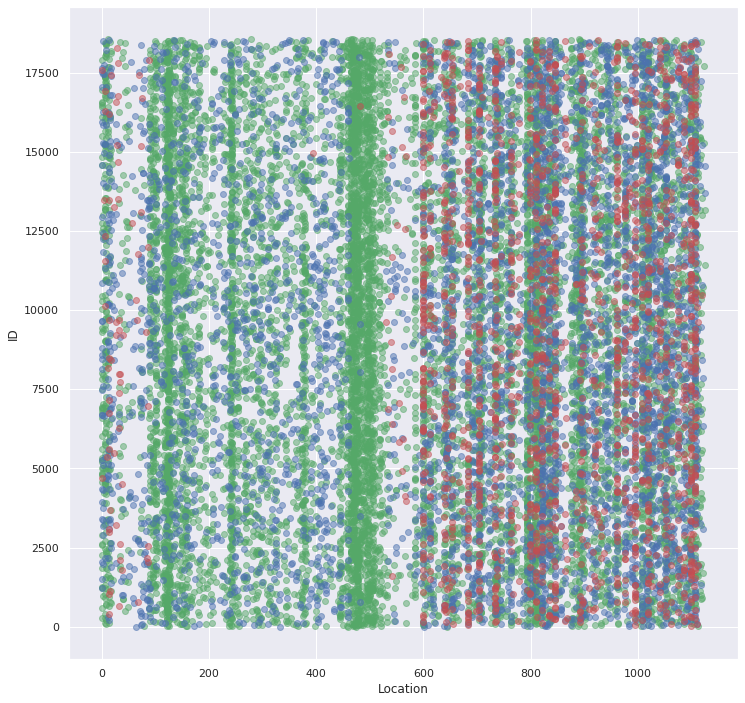

In [9]:
# plt.style.use('ggplot')
fig, ax = plt.subplots(figsize=(12,12))

ax.scatter(x = train_test[train_test['fault_severity'].isnull()]['location'], y = train_test[train_test['fault_severity'].isnull()].index,alpha=0.5,color='k',s=2)
ax.scatter(x = train_test[train_test['fault_severity'] == 0]['location'], y = train_test[train_test['fault_severity'] == 0]['id'],alpha=0.5,color='g')
ax.scatter(x = train_test[train_test['fault_severity'] == 1]['location'], y = train_test[train_test['fault_severity'] == 1]['id'],alpha=0.5,color='b')
ax.scatter(x = train_test[train_test['fault_severity'] == 2]['location'], y = train_test[train_test['fault_severity'] == 2]['id'],alpha=0.5,color='r')
ax.set_xlabel('Location')
ax.set_ylabel('ID')

Severity Types 3 and 5 are not common

In [10]:
print('Severity type of fault severity 0 \n {}'.format(train_test[train_test['fault_severity'] == 0]['severity_type'].value_counts(normalize=True)))
print('Severity type of fault severity 1 \n {}'.format(train_test[train_test['fault_severity'] == 1]['severity_type'].value_counts(normalize=True)))
print('Severity type of fault severity 2 \n {}'.format(train_test[train_test['fault_severity'] == 2]['severity_type'].value_counts(normalize=True)))

Severity type of fault severity 0 
 2.0    0.535210
1.0    0.391697
4.0    0.069334
5.0    0.003091
3.0    0.000668
Name: severity_type, dtype: float64
Severity type of fault severity 1 
 1.0    0.598945
2.0    0.357806
4.0    0.037553
5.0    0.005696
Name: severity_type, dtype: float64
Severity type of fault severity 2 
 1.0    0.651820
2.0    0.344378
4.0    0.003259
5.0    0.000543
Name: severity_type, dtype: float64


Label Orange BSs in the bs daataframe with high, medium and low number of fault severities

In [11]:
# Falut Severity 2 - low quality
bs_fault2 = train_test[train_test['fault_severity'] == 2].groupby('location').count()['severity_type'].index

# Falut Severity 1 - medium quality
bs_fault1 = train_test[(train_test['fault_severity'] == 1)].groupby('location').count()['severity_type'].index
bs_fault1 = bs_fault1[~bs_fault1.isin(bs_fault2)]

train_test['bs_quality'] = ''
# Lable Fault Severity 2
train_test.loc[train_test['location'].isin(bs_fault2), 'bs_quality'] = 'low'
# Lable Fault Severity 1
train_test.loc[train_test['location'].isin(bs_fault1), 'bs_quality'] = 'medium'
# Lable Fault Severity 0
train_test.loc[train_test['bs_quality'] == '', 'bs_quality'] = 'good'

train_test.head()

,id,location,fault_severity,severity_type,bs_quality
0,14121,118.0,1,2.0,medium
1,9320,91.0,0,2.0,medium
2,14394,152.0,1,2.0,medium
3,8218,931.0,1,1.0,low
4,14804,120.0,0,1.0,medium


Add placeholders to the train_test dataframe for all Orange BS

In [12]:
# Total number of Orange BSs
orange_bs_no = bs.shape[0]
# Total number of BSs in the train_test df
df_bs_no = train_test.location.unique().shape[0]

# Range of locations needed
bs_loc_range = range(df_bs_no, orange_bs_no)

# Average number of entries for each location
# mu = train_test.groupby('location').count()['id'].mean()
# STD of the number of entries for each location
# sig = train_test.groupby('location').count()['id'].std()
number_entry_per_loc = train_test.groupby('location').count()['id']

no_processes = multiprocessing.cpu_count()

# idx = train_test_exd.id.max() + 1

# Add locations in range bs_loc_range with random number of entries for each
def add_placeholder(loc_range):
    df_placeholder = []
    # Starting ID number and Location number
    idx = train_test.id.max() + bs_loc_range[0] 
    for loc in loc_range:
        try:
            rand_entry = random.choice(number_entry_per_loc)
            if rand_entry == 1:
                df_placeholder.append({'id': idx, 'location': loc, 'fault_severity':'', 'severity_type':'', 'bs_quality':''})
                idx += len(loc_range) // no_processes
            else:
                for i in range(1, max(3,rand_entry)):
                    df_placeholder.append({'id': idx, 'location': loc, 'fault_severity':'', 'severity_type':'', 'bs_quality':''})
                    idx += len(loc_range) // no_processes
        except:
            pass
    return pd.DataFrame(df_placeholder)

def add_placeholder_multi_process(bs_loc_range):
    range_len = len(bs_loc_range) // no_processes 
    chunks = [bs_loc_range[i::range_len] for i in range(range_len)]

    with multiprocessing.Pool(processes=no_processes) as pool:
        result = pool.map(add_placeholder, chunks) 
    
    return pd.concat(result)
    
train_test_placeholder = add_placeholder_multi_process(bs_loc_range)    

In [13]:
train_test_placeholder[['fault_severity', 'severity_type']] = train_test_placeholder[['fault_severity', 'severity_type']].apply(pd.to_numeric)
train_test_ext = pd.concat([train_test, train_test_placeholder])

In [14]:
train_test_ext.to_pickle("./dataframes/train_test_ext_v1.pkl")

Assign BSs locations in the dataset to Orange BSs based on the antenna type of Orange BSs

In [15]:
# list of low quality locations
low_q_bs = train_test_ext.loc[train_test_ext['bs_quality'] == 'low', 'location'].unique()
# list of medium quality locations
medium_q_bs = train_test_ext.loc[train_test_ext['bs_quality'] == 'medium', 'location'].unique()
# list of high quality locationss 
good_q_bs = train_test_ext.loc[train_test_ext['bs_quality'] == 'good', 'location'].unique()

# Lable Orange BSc quality as medium, good, low
# ie. if Orange BS has a SECTOR antenna, there is a higher change it's assigned a location from medium_q_bs
quality_list_n = [0, 1, 2]
quality_list = [list(low_q_bs), list(medium_q_bs), list(good_q_bs)]
def assign_location(df):
    if df == 'SECTOR':
        rand_list_num = random.choice(np.random.choice(quality_list_n, 1, p=[0.25, 0.45, 0.3]))
        try:
            rand_bs_num = random.choice(quality_list[rand_list_num])
            quality_list[rand_list_num].remove(rand_bs_num)
        except:
            return None
        return rand_bs_num
    
    elif df == 'MICROCELL':
        rand_list_num = random.choice(np.random.choice(quality_list_n, 1, p=[0.2, 0.35, 0.45]))
        try:
            rand_bs_num = random.choice(quality_list[rand_list_num])
            quality_list[rand_list_num].remove(rand_bs_num)
        except:
            return None
        return rand_bs_num
    
    elif df == 'OMNI':
        rand_list_num = random.choice(np.random.choice(quality_list_n, 1, p=[0.6, 0.3, 0.1]))
        try:
            rand_bs_num = random.choice(quality_list[rand_list_num])
            quality_list[rand_list_num].remove(rand_bs_num)
        except:
            return None
        return rand_bs_num
    
bs['location'] = bs['Anttype'].apply(assign_location)
uk_bs = bs[~((bs['location'].isnull()))].copy()
uk_bs['location'] = uk_bs['location'].apply(pd.to_numeric)


train_test_loc = train_test_ext.merge(uk_bs, left_on='location', right_on='location').drop(['Operator', 'Maxpwrdbw', 'Maxpwrdbm'], axis=1).dropna()

### Merge all Orange UK BSs

In [16]:
# BSs that do not have a location assigned
bs_available = bs[~((bs['Sitelat'].isin(train_test_loc['Sitelat'])) & (bs['Sitelng'].isin(train_test_loc['Sitelng'])))].copy()
# Locations in Train_Test_Ext that do not have a fault_severity and bs_quality assigned
train_test_available = train_test_ext[train_test_ext['severity_type'].isnull()].copy()

# Assign a Location column equal to the length of the location column in train_test_available
bs_available.loc[:,'location'] = train_test_available.location.unique()[:bs_available.shape[0]]

# Merge the dataframe on location column and append it to the main dataset
train_test_available = train_test_available.merge(bs_available, on='location').drop(['Operator', 'Maxpwrdbw', 'Maxpwrdbm'], axis=1)

#### Imputing missing fault_severity using KNN again to impute ault_severity	severity_type based on location

In [17]:
# Train KNN learner
clf = KNeighborsClassifier(2, weights='distance')
trained_model = clf.fit(train_test_loc.loc[:, ['Sitelng','Sitelat']], train_test_loc.loc[:, ['fault_severity', 'severity_type']])
# trained_model = clf.fit(train_test_sev_loc.loc[:, ['Sitelng','Sitelat','Anttype','Sitengr', 'Opref', 'Transtype', 'Antennaht']], train_sev_log_rs.loc[:, ['fault_severity', 'severity_type']])

train_test_available[['fault_severity','severity_type']] = trained_model.predict(train_test_available.loc[:, ['Sitelng','Sitelat']])
train_test_all = train_test_loc.append(train_test_available)
train_test_all.head()

,id,location,fault_severity,severity_type,bs_quality,Opref,Sitengr,Antennaht,Transtype,Freqband,Anttype,Powerdbw,Sitelat,Sitelng
0,14121,118.0,1.0,2.0,medium,BED0112,TL1783048460,19.0,GSM,1800,SECTOR,28.0,52.121469,-0.278735
1,6821,118.0,0.0,1.0,medium,BED0112,TL1783048460,19.0,GSM,1800,SECTOR,28.0,52.121469,-0.278735
2,12008,118.0,0.0,2.0,medium,BED0112,TL1783048460,19.0,GSM,1800,SECTOR,28.0,52.121469,-0.278735
3,18441,118.0,0.0,2.0,medium,BED0112,TL1783048460,19.0,GSM,1800,SECTOR,28.0,52.121469,-0.278735
4,9479,118.0,0.0,2.0,medium,BED0112,TL1783048460,19.0,GSM,1800,SECTOR,28.0,52.121469,-0.278735


### Timestame events in the dataset

In [18]:
# Sort the dataframe based on location and id (ascending)
train_test_time = train_test_all.sort_values(['location', 'id'], ascending=[True, True])

train_test_time['num'] = train_test_time.groupby(['location']).cumcount()+1
# Normalize the count within each location
train_test_time['numsh'] = train_test_time.groupby('location')['num'].apply(lambda x: x / (x.max() + 1))

def str_time_prop(start, end, format, prop):
    """Get a time at a proportion of a range of two formatted times.

    start and end should be strings specifying times formated in the
    given format (strftime-style), giving an interval [start, end].
    prop specifies how a proportion of the interval to be taken after
    start.  The returned time will be in the specified format.
    """

    stime = time.mktime(time.strptime(start, format))
    etime = time.mktime(time.strptime(end, format))

    ptime = stime + prop * (etime - stime)

    return time.strftime(format, time.localtime(ptime))


def random_date(start, end, prop):
    return str_time_prop(start, end, '%d/%m/%Y %I:%M %p', prop)

# Convert numsh column to real time 
train_test_time['time'] = train_test_time.loc[:,'numsh'].apply(lambda x: random_date("01/01/2014 12:00 AM", "01/01/2017 12:00 PM", x))
pd.to_datetime(train_test_time['time'])
train_test_time.head()

,id,location,fault_severity,severity_type,bs_quality,Opref,Sitengr,Antennaht,Transtype,Freqband,Anttype,Powerdbw,Sitelat,Sitelng,num,numsh,time
5825,282,1.0,0.0,2.0,low,AVN7004,ST5875073050,10.0,UMTS,2100,MICROCELL,13.9,51.454438,-2.593739,1,0.014286,16/01/2014 03:56 PM
5813,590,1.0,0.0,2.0,low,AVN7004,ST5875073050,10.0,UMTS,2100,MICROCELL,13.9,51.454438,-2.593739,2,0.028571,01/02/2014 07:53 AM
5850,1233,1.0,0.0,1.0,low,AVN7004,ST5875073050,10.0,UMTS,2100,MICROCELL,13.9,51.454438,-2.593739,3,0.042857,16/02/2014 11:49 PM
5800,1235,1.0,1.0,1.0,low,AVN7004,ST5875073050,10.0,UMTS,2100,MICROCELL,13.9,51.454438,-2.593739,4,0.057143,04/03/2014 03:46 PM
5805,1247,1.0,0.0,1.0,low,AVN7004,ST5875073050,10.0,UMTS,2100,MICROCELL,13.9,51.454438,-2.593739,5,0.071429,20/03/2014 07:42 AM


In [19]:
train_test_time.to_pickle("./dataframes/train_test_time_v1.pkl")

#### Distribution of BSs accross the UK and their average fault severity (sample size = 1.4%)

In [20]:
sample_df = train_test_time.sample(frac=.014, random_state=1)
# Average fault_severity of each location
fault_severity_mean = sample_df[['location', 'fault_severity', 'Sitelat', 'Sitelng']].groupby('location').mean().reset_index()
fault_severity_mean['marker_color'] = pd.cut(fault_severity_mean['fault_severity'], bins=3, 
                              labels=['green', 'orange', 'red'])

# colors = {'SECTOR': 'blue', 'MICROCELL': 'green', 'OMNI': 'red'}
map_osm = folium.Map(
                     zoom_start=6,
                     location=[fault_severity_mean['Sitelat'].mean(), 
                     fault_severity_mean['Sitelng'].mean()],
                     control_scale=True)

fault_severity_mean.apply(lambda row:folium.CircleMarker(location=[row["Sitelat"], 
                                               row["Sitelng"]], 
                                               fill_color=row['marker_color'], 
                                               fill=True, fill_opacity=0.7, color='r', radius=1.5).add_to(map_osm), axis=1)
map_osm

In [21]:
sample_df = train_test_time.sample(frac=.051, random_state=1)
# Average fault_severity of each location
fault_severity_mean = sample_df[['location', 'fault_severity', 'Sitelat', 'Sitelng']].groupby(['Sitelat', 'Sitelng']).count().reset_index()
fault_severity_mean['marker_color'] = pd.cut(fault_severity_mean['fault_severity'], bins=3, 
                              labels=['green', 'orange', 'red'])

# colors = {'SECTOR': 'blue', 'MICROCELL': 'green', 'OMNI': 'red'}
map_osm = folium.Map(
                     zoom_start=6,
                     location=[fault_severity_mean['Sitelat'].mean(), 
                     fault_severity_mean['Sitelng'].mean()],
                     control_scale=True)

mc = MarkerCluster()
fault_severity_mean.apply(lambda row:folium.Marker(location=[row["Sitelat"], 
                                               row["Sitelng"]]).add_to(mc), axis=1)

map_osm.add_child(mc)
map_osm

In [22]:
# train_test_sev_loc_time[train_test_sev_loc_time['location'].isin(range(2000))].plot(x='time', y='fault_severity', kind='kde', bw_method=.1)

## EDA

#### 1. Timeseries Analysis

In [23]:
# Set the time column as index and sort it
df_timeseries = train_test_time.set_index(pd.DatetimeIndex(train_test_time['time'])).sort_index()

In [24]:
# df_timeseries = df_timeseries.loc['2014-1-1':'2017-02-10']

/usr/local/lib/python3.6/dist-packages/IPython/core/events.py:88: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/usr/local/lib/python3.6/dist-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


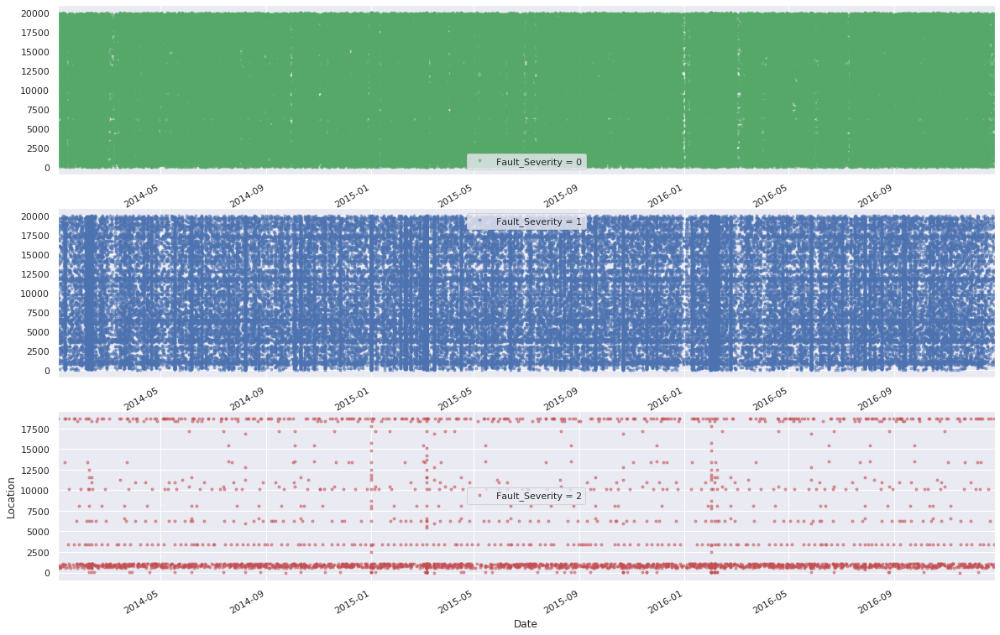

In [25]:
fig, axes = plt.subplots(3,1, figsize=(20, 14))

df_timeseries[df_timeseries['fault_severity'] == 0]['location'].plot(marker='.', color='g', alpha=0.5, linestyle='None', figsize=(20, 14), ax=axes[0], label='Fault_Severity = 0')
df_timeseries[df_timeseries['fault_severity'] == 1]['location'].plot(marker='.', color='b', alpha=0.5, linestyle='None', figsize=(20, 14), ax=axes[1], label='Fault_Severity = 1')
df_timeseries[df_timeseries['fault_severity'] == 2]['location'].plot(marker='.', color='r', alpha=0.5, linestyle='None', figsize=(20, 14), ax=axes[2], label='Fault_Severity = 2')
plt.xlabel('Date')
plt.ylabel('Location')

for i in range(3):
    axes[i].legend()

#### 2. Analysis of fault_severity and severity_types per Season/Week

Weekly sum resample of fault_severity

(735234.0, 736288.0)

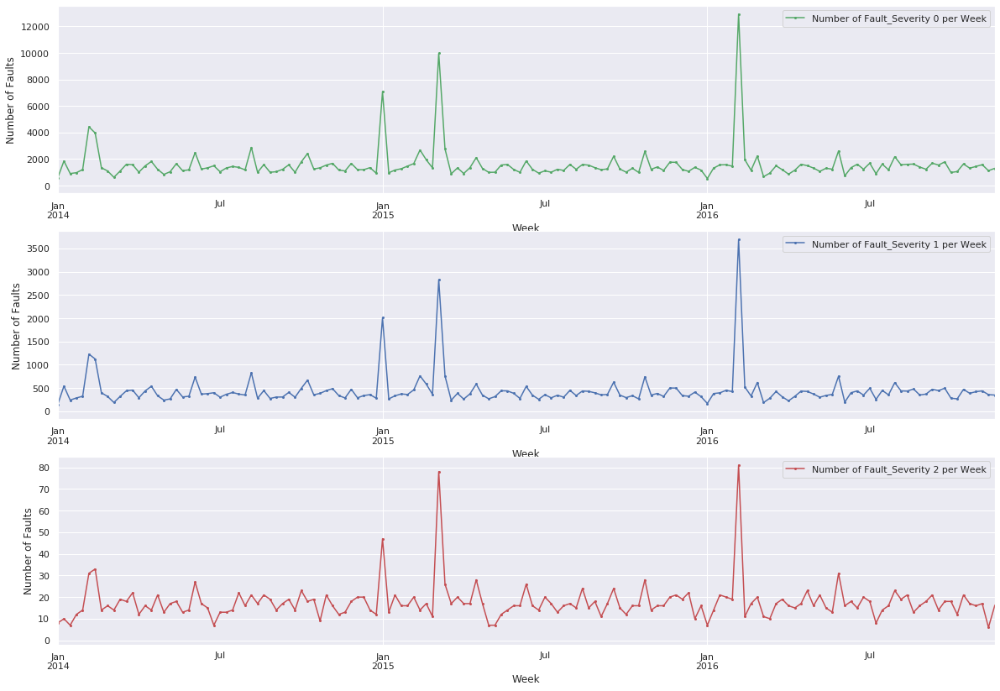

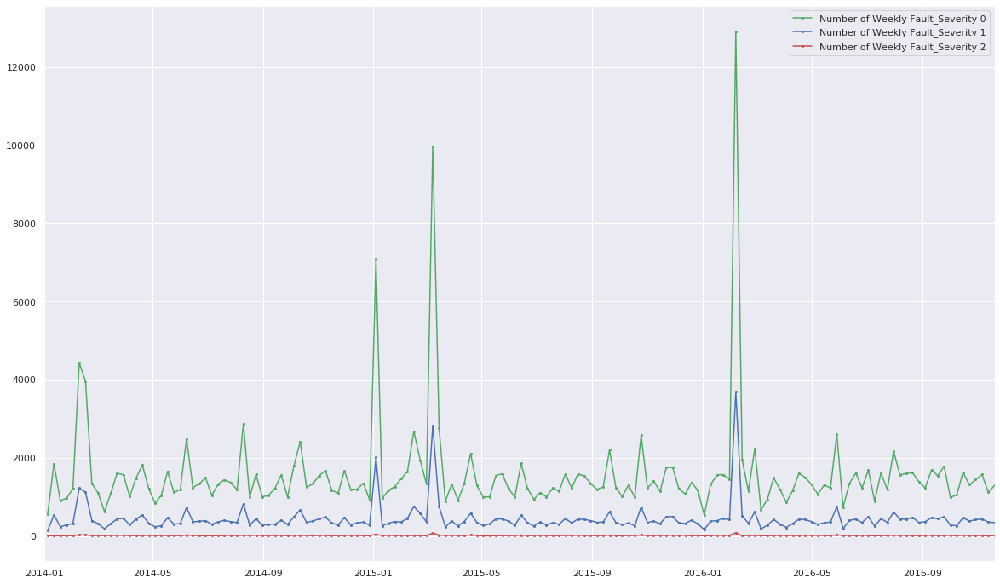

In [26]:
def sum_weekly(fault_sev):
    df = df_timeseries[df_timeseries['fault_severity'] == fault_sev]['fault_severity'].copy()
    df[:] = 1
    return df.resample('W').sum()

fig3, ax3 = plt.subplots(3,1, figsize=(20, 14))
sum_weekly(0).plot(marker='o', markersize=2, linestyle='-', color='g',
            label='Number of Fault_Severity {} per Week'.format(0), figsize=(20, 14), ax=ax3[0])
sum_weekly(1).plot(marker='o', markersize=2, linestyle='-', color='b',
            label='Number of Fault_Severity {} per Week'.format(1), figsize=(20, 14), ax=ax3[1])
sum_weekly(2).plot(marker='o', markersize=2, linestyle='-', color='r',
            label='Number of Fault_Severity {} per Week'.format(2), figsize=(20, 14), ax=ax3[2])
for i in range(3):
    ax3[i].set_ylabel('Number of Faults')
    ax3[i].set_xlabel('Week')
    ax3[i].legend()
    ax3[i].set_xlim('2014','2016-11-20')

colors = ['g','b','r']
fig4, ax4 = plt.subplots(figsize=(20, 12))
for i in range(3):
    ax4.plot(sum_weekly(i), linestyle='-', marker='o', markersize=2, label='Number of Weekly Fault_Severity {}'.format(i), color=colors[i]) 
ax4.legend()
ax4.set_xlim('2014','2016-11-20')

Quarterly sum resample of fault_severity

(735234.0, 736288.0)

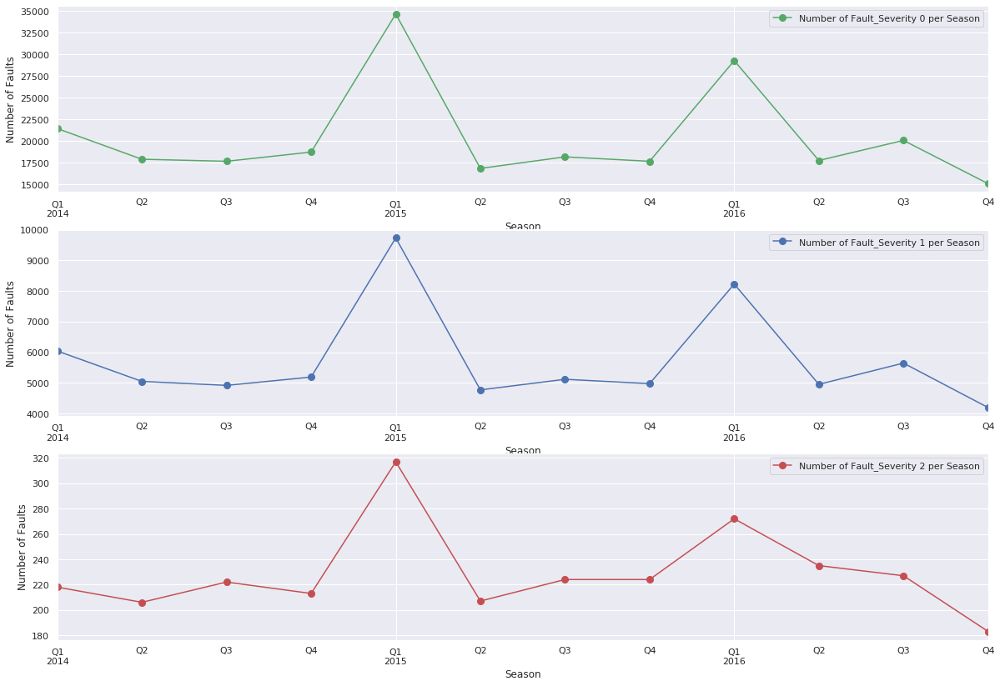

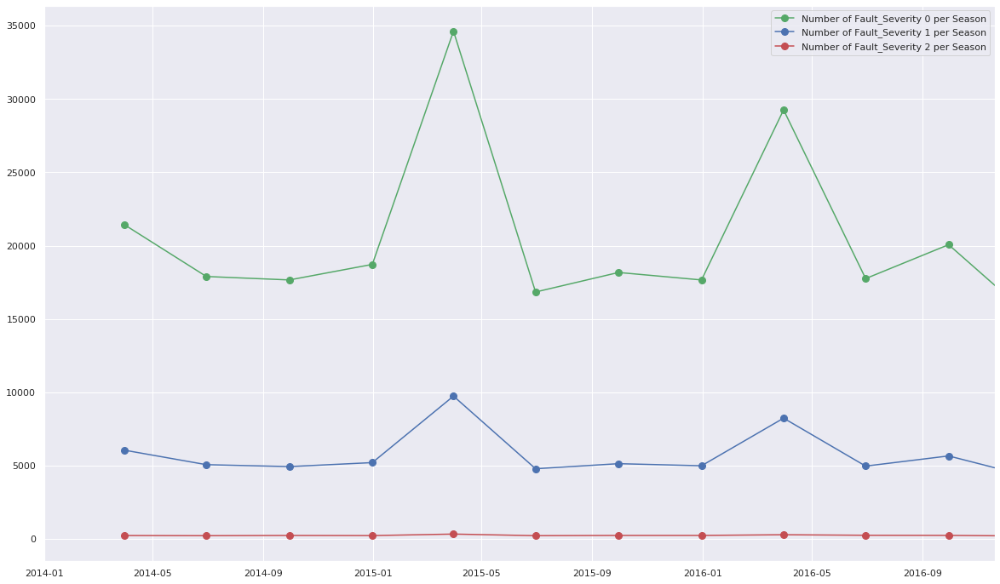

In [27]:
def sum_quarterly(fault_sev):
    df = df_timeseries[df_timeseries['fault_severity'] == fault_sev]['fault_severity'].copy()
    df[:] = 1
    return df.resample('Q').sum()

fig1, ax1 = plt.subplots(3,1, figsize=(20, 14))
sum_quarterly(0).plot(marker='o', markersize=8, linestyle='-', color='g',
            label='Number of Fault_Severity {} per Season'.format(0), figsize=(20, 14), ax=ax1[0])
sum_quarterly(1).plot(marker='o', markersize=8, linestyle='-', color='b',
            label='Number of Fault_Severity {} per Season'.format(1), figsize=(20, 14), ax=ax1[1])
sum_quarterly(2).plot(marker='o', markersize=8, linestyle='-', color='r',
            label='Number of Fault_Severity {} per Season'.format(2), figsize=(20, 14), ax=ax1[2])
for i in range(3):
    ax1[i].set_ylabel('Number of Faults')
    ax1[i].set_xlabel('Season')
    ax1[i].legend()
    ax1[i].set_xlim('2014','2016-11-20')

fig2, ax2 = plt.subplots(figsize=(20, 12))
colors = ['g', 'b', 'r']
for i in range(3):
    ax2.plot(sum_quarterly(i), linestyle='-', marker='o', markersize=8, label='Number of Fault_Severity {} per Season'.format(i), color=colors[i]) 
ax2.legend()
ax2.set_xlim('2014','2016-11-20')

Number of Severity_Types per Season

(735234.0, 736288.0)

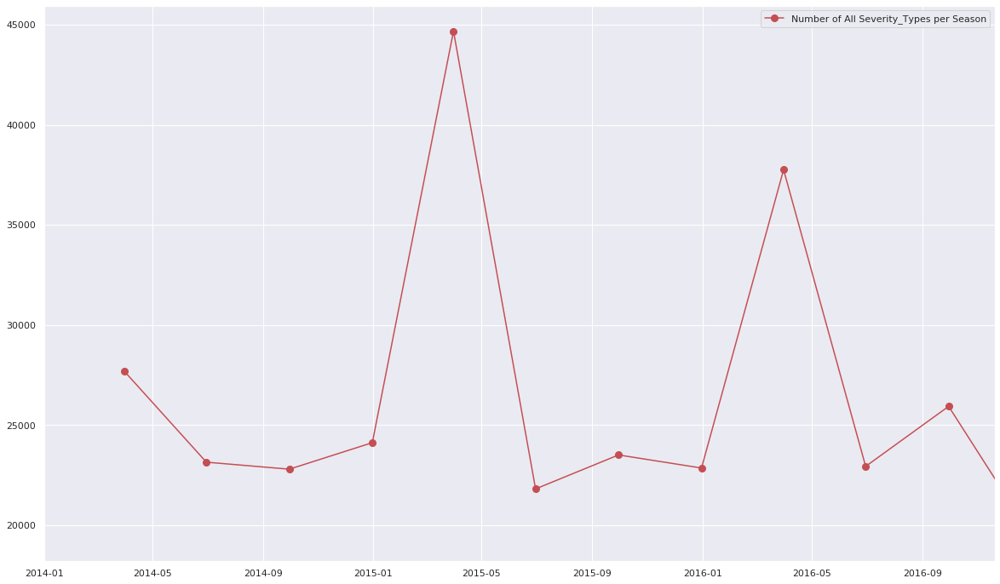

In [28]:
def sum_quarterly():
    df = df_timeseries['severity_type'].copy()
    df[:] = 1
    return df.resample('Q').sum()

fig1, ax1 = plt.subplots(figsize=(20, 12))
# for i in range(1,6):
ax1.plot(sum_quarterly(), linestyle='-', marker='o', markersize=8, color='r', label='Number of All Severity_Types per Season') 
ax1.legend()
ax1.set_xlim('2014','2016-11-20')

### 2. Workforce Utilisation

#### Seasonal Total Faults of 2 Engineers with the Highest Number of Faults

In [29]:
# Find the top 5 and bottom 5 bussiest engineers
top_5 = df_timeseries.groupby('Sitengr').count()['id'].sort_values(ascending=False).index[:40:20].to_list()
bottom_5 = df_timeseries.groupby('Sitengr').count()['id'].sort_values(ascending=True).index[10240:10400:80].to_list()

In [30]:
# Resample the number of faults they rectified per season 
season_fault_location = df_timeseries.groupby('Sitengr').resample('Q').count()
# weekly_fault_location = df_timeseries.groupby('location').resample('M').count()

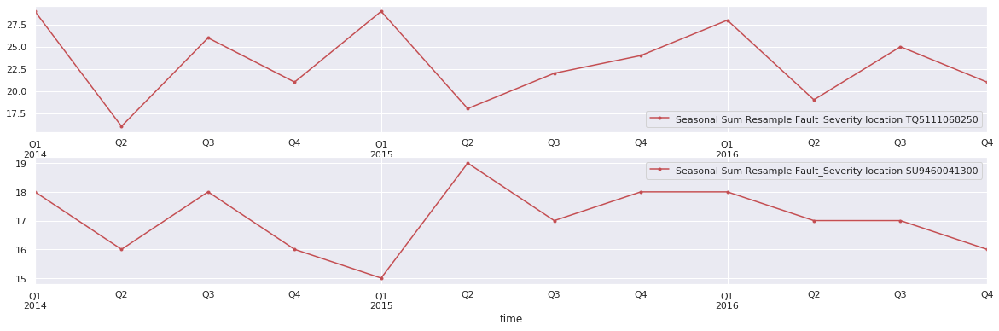

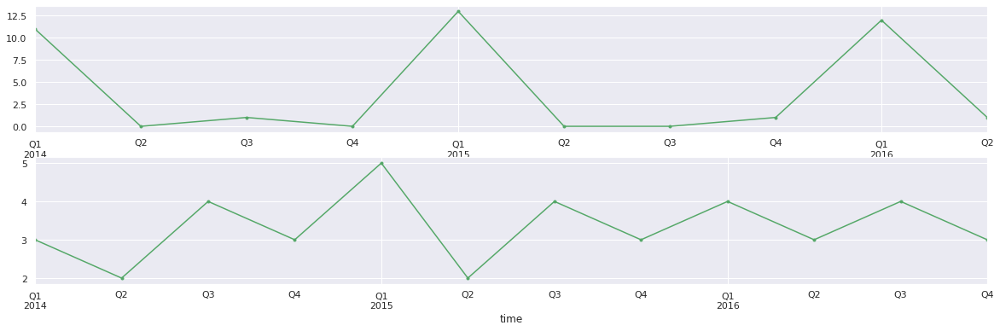

In [31]:
fig1, ax1 = plt.subplots(2,1, figsize=(20, 6))
for i, j in enumerate(top_5):
    season_fault_location.loc[top_5[i], 'fault_severity'].plot(marker='o', markersize=3, linestyle='-', color='r',
                label='Seasonal Sum Resample Fault_Severity location {}'.format(top_5[i]), ax=ax1[i])
    ax1[i].legend()

fig2, ax2 = plt.subplots(2,1, figsize=(20, 6))
for i, j in enumerate(bottom_5):
    season_fault_location.loc[bottom_5[i], 'fault_severity'].plot(marker='o', markersize=3, linestyle='-', color='g',
                label='Seasonal Sum Resample Fault_Severity {}'.format(bottom_5[i]), ax=ax2[i])

#### Different Types of  Faults of 2 Nearby Engineers at different S

In [32]:
season_fault_eng = train_test_time.groupby(['Sitengr', 'fault_severity','time']).count().reset_index()
# season_fault_engineer = season_fault_eng.set_index(pd.DatetimeIndex(season_fault_eng['time'])).sort_index()
season_fault_eng['fs0'] = season_fault_eng[season_fault_eng['fault_severity']== 0]['id']
season_fault_eng['fs1'] = season_fault_eng[season_fault_eng['fault_severity']== 1]['id']
season_fault_eng['fs2'] = season_fault_eng[season_fault_eng['fault_severity']== 2]['id']
season_fault_eng['fs0'].fillna(0,inplace=True)
season_fault_eng['fs1'].fillna(0,inplace=True)
season_fault_eng['fs2'].fillna(0,inplace=True)
season_fault_eng = season_fault_eng[['Sitengr','id','fs0','fs1','fs2','time']]
season_fault_eng_f0 = season_fault_eng[season_fault_eng['fs0'] == 1]
season_fault_eng_f1 = season_fault_eng[season_fault_eng['fs1'] == 1]
season_fault_eng_f2 = season_fault_eng[season_fault_eng['fs2'] == 1]
season_fault_engineer_f0 = season_fault_eng_f0.set_index(pd.DatetimeIndex(season_fault_eng_f0['time'])).sort_index().drop(['time','fs1','fs2','id'],axis=1)
season_fault_engineer_f1 = season_fault_eng_f1.set_index(pd.DatetimeIndex(season_fault_eng_f1['time'])).sort_index().drop(['time','fs0','fs2','id'],axis=1)
season_fault_engineer_f2 = season_fault_eng_f2.set_index(pd.DatetimeIndex(season_fault_eng_f2['time'])).sort_index().drop(['time','fs0','fs1','id'],axis=1)
# season_fault_location = df_timeseries.groupby('Sitengr').resample('Q').count()

# season_fault_location = df_timeseries.groupby('Sitengr').resample('Q').count()


In [33]:
# Resample the number of faults they rectified per season 
seasonal_fault_engineer_f0 = season_fault_engineer_f0.groupby('Sitengr').resample('Q').count()
seasonal_fault_engineer_f1 = season_fault_engineer_f1.groupby('Sitengr').resample('Q').count()
seasonal_fault_engineer_f2 = season_fault_engineer_f2.groupby('Sitengr').resample('Q').count()
# weekly_fault_location = df_timeseries.groupby('location').resample('M').count()

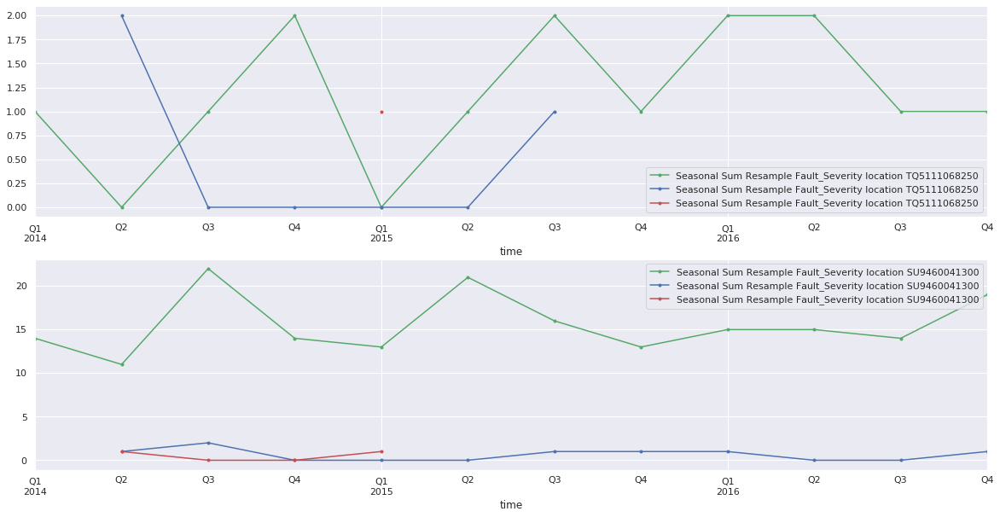

In [49]:
fig1, ax1 = plt.subplots(2,1, figsize=(20, 10))
for i, j in enumerate(['IC9470040490','ID1130905581']):
    seasonal_fault_engineer_f0.loc[j, 'fs0'].plot(marker='o', markersize=3, linestyle='-', color='g',
                label='Seasonal Sum Resample Fault_Severity location {}'.format(top_5[i]), ax=ax1[i])
    
    seasonal_fault_engineer_f1.loc[j, 'fs1'].plot(marker='o', markersize=3, linestyle='-', color='b',
            label='Seasonal Sum Resample Fault_Severity location {}'.format(top_5[i]), ax=ax1[i])
    seasonal_fault_engineer_f2.loc[j, 'fs2'].plot(marker='o', markersize=3, linestyle='-', color='r',
            label='Seasonal Sum Resample Fault_Severity location {}'.format(top_5[i]), ax=ax1[i])
    ax1[i].legend()

In [51]:
# le = LabelEncoder()
# train_test_eng = train_test_time.copy()
# train_test_eng['site_eng'] = le.fit_transform(train_test_eng['Sitengr'])
sitengr_fault = train_test_time.groupby(['Sitengr', 'fault_severity']).count().reset_index()[["Sitengr","fault_severity","id"]]
# eng[eng['fault_severity'] == 0].plot('Sitengr','fault_severity', kind='bar', apha=.5)
# eng = eng.sample(frac=.06)
# fig, ax = plt.subplots(1,1, figsize=(30, 15))
# plt.bar(x=eng[eng['fault_severity'] == 0]['site_eng'], height=eng[eng['fault_severity'] == 0]['id'],align='edge', color='g',edgecolor='black')
# plt.bar(x=eng[eng['fault_severity'] == 1]['site_eng'], height=eng[eng['fault_severity'] == 1]['id'],align='edge', color='b', edgecolor='black')
# plt.bar(x=eng[eng['fault_severity'] == 2]['site_eng'], height=eng[eng['fault_severity'] == 2]['id'],align='edge',color='r', edgecolor='black')
# # plt.xlim(-10000, 20000)
# plt.show()
sitengr_fault = sitengr_fault.set_index('Sitengr')
# [['id','fs0','fs1','fs2']]
# fig, ax = plt.subplots(1,1, figsize=(30, 15))
# fig, ax = plt.subplots(1,1, figsize=(30, 15))
# plt.bar(x=eng.index, height=eng['fs0'], width=1, color='g')

# plt.bar(x=eng.index, height=eng['fs1'], width=4,color='b')
# plt.bar(x=eng.index, height=eng['fs2'], width=4, color='r')
# fig, ax = plt.subplots(1,1, figsize=(30, 15))
sitengr_fault['fs0'] = sitengr_fault[sitengr_fault['fault_severity']== 0]['id']
sitengr_fault['fs1'] = sitengr_fault[sitengr_fault['fault_severity']== 1]['id']
sitengr_fault['fs2'] = sitengr_fault[sitengr_fault['fault_severity']== 2]['id']
sitengr_fault.drop(['fault_severity'],axis=1,inplace=True)
sitengr_fault['fs0'].fillna(0,inplace=True)
sitengr_fault['fs1'].fillna(0,inplace=True)
sitengr_fault['fs2'].fillna(0,inplace=True)
sitengr_fault.plot.bar(y=['fs0','fs1','fs2'],stacked=True,figsize=(30, 15),color=['g','b','r'], width=10, alpha=.6)

(0, 200)

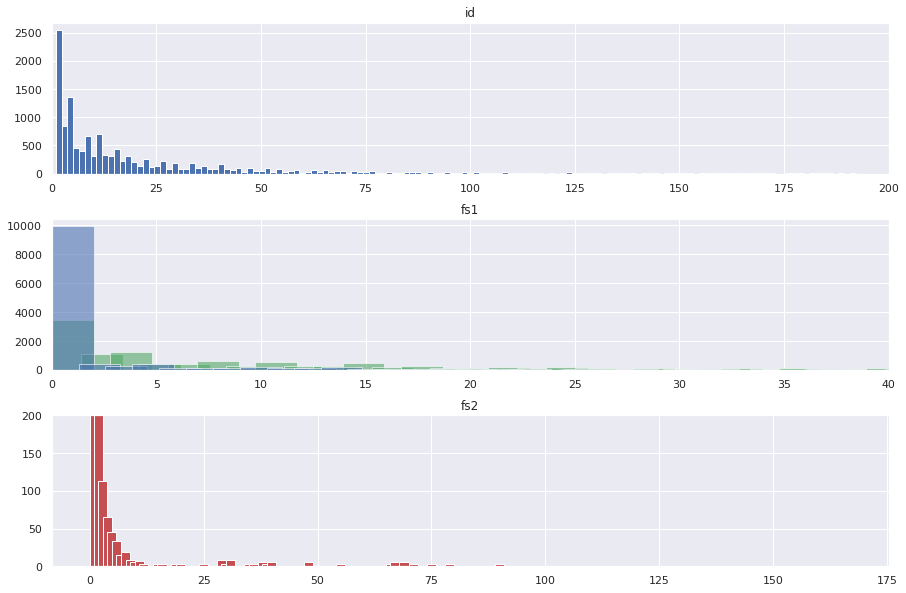

In [52]:
fig, ax = plt.subplots(3,1, figsize=(15, 10))

sitengr_fault.hist('id', bins=200, ax=ax[0])
sitengr_fault.hist('fs0', bins=200,ax=ax[1],alpha=.6,color='g',width=2)
sitengr_fault.hist('fs1', bins=200,ax=ax[1],alpha=.6,color='b',width=2)
sitengr_fault.hist('fs2', bins=1000,ax=ax[2],color='r',width=2)
ax[0].set_xlim(0,200)
ax[1].set_xlim(0,40)
# ax[1].set_ylim(0,600)
ax[2].set_ylim(0,200)

In [53]:
# sitengr_fault_loc = pd.merge(sitengr_fault, train_test_time, how='left',on='id')[["Sitengr","fs0","fs1","fs2","id","Sitelat","Sitelng","time"]]
# sitengr_fault_location = sitengr_fault_loc.set_index(pd.DatetimeIndex(sitengr_fault_loc['time'])).sort_index()
# sitengr_fault_location.groupby(['Sitengr','Sitelat','Sitelng']).resample('Q').count()['id'].reset_index().set_index('Sitengr')

#### Coverage Areas of Different Engineers

In [187]:
lat_lng = train_test_loc.drop_duplicates(['Sitengr','Sitelat','Sitelng'])
site_lat = lat_lng['Sitelat']
site_lng = lat_lng['Sitelng']
engineer = lat_lng['Sitengr'].unique()

box = (site_lat.min(), site_lng.min(),
       site_lat.max(), site_lng.max())
m = smopy.Map(box, z=6)

vor = spatial.Voronoi(np.c_[site_lat, site_lng])

In [611]:
def voronoi_finite_polygons_2d(vor, radius=None):
    """
    Reconstruct infinite voronoi regions in a 2D diagram to finite
    regions.

    Parameters
    ----------
    vor : Voronoi
        Input diagram
    radius : float, optional
        Distance to 'points at infinity'.

    Returns
    -------
    regions : list of tuples
        Indices of vertices in each revised Voronoi regions.
    vertices : list of tuples
        Coordinates for revised Voronoi vertices. Same as coordinates
        of input vertices, with 'points at infinity' appended to the
        end.

    """

    if vor.points.shape[1] != 2:
        raise ValueError("Requires 2D input")

    new_regions = []
    new_vertices = vor.vertices.tolist()

    center = vor.points.mean(axis=0)
    if radius is None:
        radius = vor.points.ptp().max()

    # Construct a map containing all ridges for a given point
    all_ridges = {}
    for (p1, p2), (v1, v2) in zip(vor.ridge_points, vor.ridge_vertices):
        all_ridges.setdefault(p1, []).append((p2, v1, v2))
        all_ridges.setdefault(p2, []).append((p1, v1, v2))

    # Reconstruct infinite regions
    for p1, region in enumerate(vor.point_region):
        vertices = vor.regions[region]

        if all(v >= 0 for v in vertices):
            # finite region
            new_regions.append(vertices)
            continue

        # reconstruct a non-finite region
        ridges = all_ridges[p1]
        new_region = [v for v in vertices if v >= 0]

        for p2, v1, v2 in ridges:
            if v2 < 0:
                v1, v2 = v2, v1
            if v1 >= 0:
                # finite ridge: already in the region
                continue

            # Compute the missing endpoint of an infinite ridge

            t = vor.points[p2] - vor.points[p1] # tangent
            t /= np.linalg.norm(t)
            n = np.array([-t[1], t[0]])  # normal

            midpoint = vor.points[[p1, p2]].mean(axis=0)
            direction = np.sign(np.dot(midpoint - center, n)) * n
            far_point = vor.vertices[v2] + direction * radius

            new_region.append(len(new_vertices))
            new_vertices.append(far_point.tolist())

        # sort region counterclockwise
        vs = np.asarray([new_vertices[v] for v in new_region])
        c = vs.mean(axis=0)
        angles = np.arctan2(vs[:,1] - c[1], vs[:,0] - c[0])
        new_region = np.array(new_region)[np.argsort(angles)]

        # finish
        new_regions.append(new_region.tolist())

    return new_regions, np.asarray(new_vertices)

In [619]:
regions, vertices = voronoi_finite_polygons_2d(vor)
cells = [m.to_pixels(vertices[region]) for region in regions]

cmap = plt.cm.Set3
colors_districts = cmap(
    np.linspace(0., 1., len(engineer)))[:, :3]
colors = .25 * np.ones((len(engineer)+1, 3))
colors = .5 *colors_districts

ax = m.show_mpl(figsize=(20, 20),dpi=400)
ax.add_collection(
    mpl.collections.PolyCollection(cells, facecolors=colors,
        edgecolors='k', alpha=.6))

# ax.set_xscale('log')
# ax.set_yscale('log')
# ax.set_aspect('equal')
plt.savefig('./out.png')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


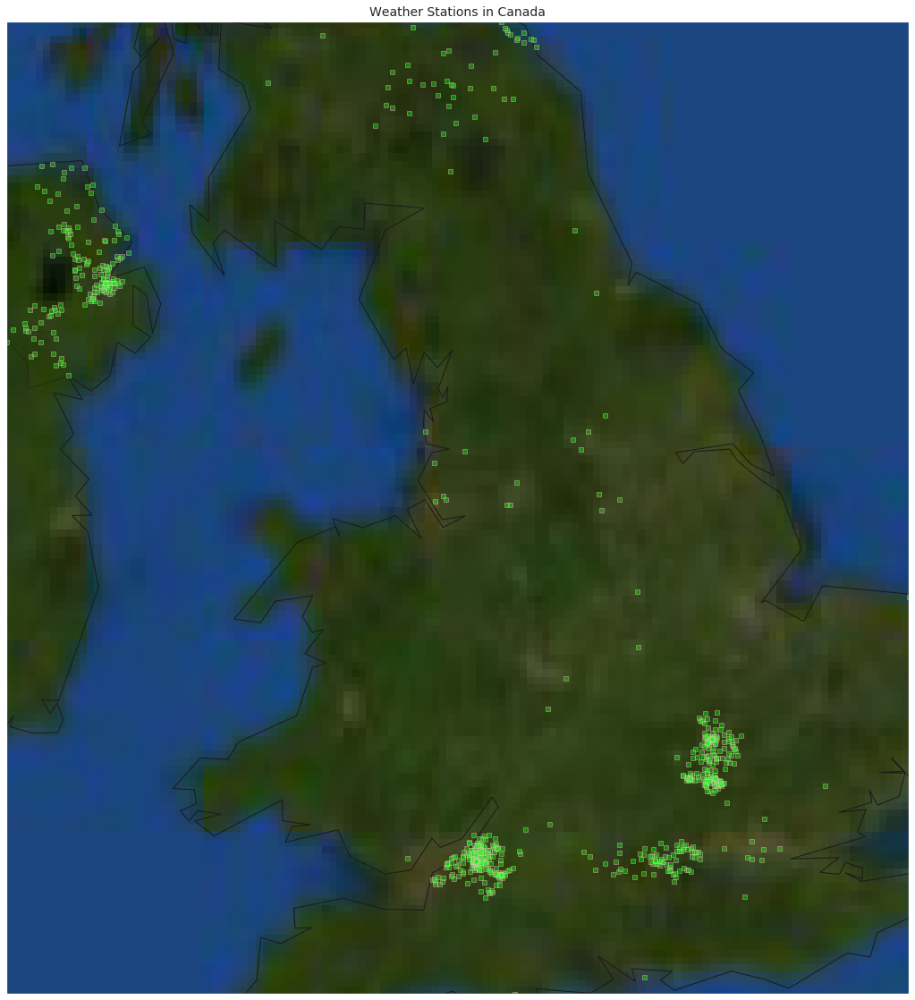

In [188]:
from mpl_toolkits.basemap import Basemap
import matplotlib
from PIL import Image
from pylab import rcParams

rcParams['figure.figsize'] = (20,20)

# selecting the boundaries of the map from lattitude and longitude 

# lat_lng = lat_lng[(lat_lng['Sitelng'] > lat_lng['Sitelng'].min()) & (lat_lng['Sitelng'] < lat_lng['Sitelng'].max()) & 
# (lat_lng['Sitelat'] > lat_lng['Sitelat'].min()) & (lat_lng['Sitelat'] < lat_lng['Sitelat'].max())]



my_map = Basemap(projection='merc',resolution = 'l', area_thresh = 1000.0,
            llcrnrlon=lat_lng['Sitelng'].min(), llcrnrlat=lat_lng['Sitelat'].min(), #min longitude (llcrnrlon) and latitude (llcrnrlat)
            urcrnrlon=lat_lng['Sitelng'].max(), urcrnrlat=lat_lng['Sitelat'].max()) #max longitude (urcrnrlon) and latitude (urcrnrlat)

my_map.drawcoastlines()
my_map.drawcountries()
my_map.drawlsmask()
#my_map.shadedrelief()
my_map.bluemarble()
# To collect data based on stations        

xs,ys = my_map(np.asarray(lat_lng['Sitelng']), np.asarray(lat_lng['Sitelat']))
lat_lng['xm']= xs.tolist()
lat_lng['ym'] =ys.tolist()

# #Visualization1
for index,row in lat_lng.iterrows():
#   x,y = my_map(row.Long, row.Lat)
   my_map.plot(row.xm, row.ym,markerfacecolor ='lime',markeredgecolor='pink', marker='s', markersize= 5, alpha = 0.4)
# plt.text(x,y,stn)

plt.title("Weather Stations in Canada", fontsize=14)
# plt.savefig("Canada_WS.png", dpi=300)
plt.show()

#### Clustering Engineers in Similar Areas with Similar Fault_Severity Together

In [191]:
engineer_dataframe = lat_lng[['fault_severity','xm','ym']]
engineer_dataframe = engineer_dataframe.groupby(['xm','ym']).count().reset_index()
# le = LabelEncoder()
# train_df['site_eng'] = le.fit_transform(train_df['Sitengr'])

engineer_dataframe.head()

,xm,ym,fault_severity
0,0.000000,654916.208309,1
1,5889.102932,667220.717945,1
2,17647.404913,673267.284068,1
3,18549.862513,668690.084893,1
4,18790.933000,666080.102076,1


In [207]:
from sklearn.cluster import DBSCAN
import sklearn.utils
from sklearn.preprocessing import StandardScaler


lat_lng_engineer = StandardScaler().fit_transform(engineer_dataframe)

db = DBSCAN(eps=0.3, min_samples=10).fit(lat_lng_engineer)
labels = db.labels_
print(labels[500:560])
engineer_dataframe["clus_db"]=labels

realClusterNum=len(set(labels)) - (1 if -1 in labels else 0)
clusterNum = len(set(labels))

[5 5 6 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 6 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5]


#### Plot the Clusters on the Map

Cluster 0, Average Mean Falut_Severity: 1.0
Cluster 1, Average Mean Falut_Severity: 1.0
Cluster 2, Average Mean Falut_Severity: 1.0
Cluster 3, Average Mean Falut_Severity: 1.0
Cluster 4, Average Mean Falut_Severity: 1.0
Cluster 5, Average Mean Falut_Severity: 1.0
Cluster 6, Average Mean Falut_Severity: 1.0


Text(0.5, 1.0, 'Engineers in the UK (1): $ \\epsilon = 0.3$')

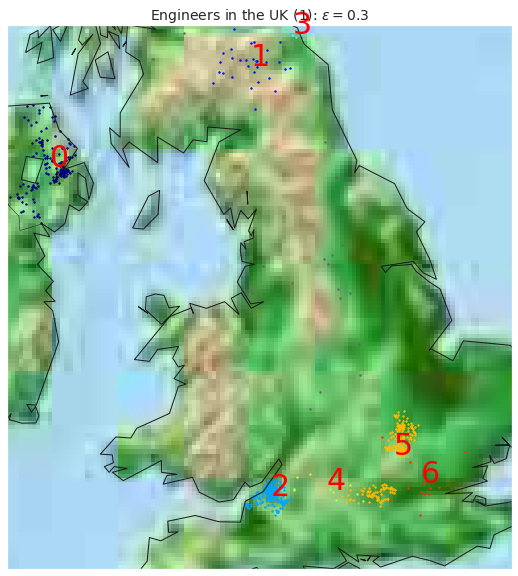

In [208]:
from pylab import rcParams

rcParams['figure.figsize'] = (10,10)

my_map = Basemap(projection='merc',
            resolution = 'l', area_thresh = 10.0,
            llcrnrlon=lat_lng['Sitelng'].min(), llcrnrlat=lat_lng['Sitelat'].min(), #min longitude (llcrnrlon) and latitude (llcrnrlat)
            urcrnrlon=lat_lng['Sitelng'].max(), urcrnrlat=lat_lng['Sitelat'].max()) #max longitude (urcrnrlon) and latitude (urcrnrlat)

my_map.drawcoastlines()
my_map.drawcountries()
#my_map.drawmapboundary()
#my_map.fillcontinents(color = 'white', alpha = 0.3)
my_map.drawlsmask(land_color='orange', ocean_color='skyblue')
#my_map.shadedrelief()
#my_map.bluemarble()
#my_map.shadedrelief()
my_map.etopo()

# To create a color map
colors = plt.get_cmap('jet')(np.linspace(0.0, 1.0, clusterNum))



#Visualization1
for clust_number in set(labels):
    c=(([0.4,0.4,0.4]) if clust_number == -1 else colors[np.int(clust_number)])
    clust_set = engineer_dataframe[engineer_dataframe.clus_db == clust_number]                    
    my_map.scatter(clust_set.xm, clust_set.ym, color =c,  marker='o', s= 2, alpha = 0.99)
    if clust_number != -1:
        cenx=np.mean(clust_set.xm) 
        ceny=np.mean(clust_set.ym) 
        plt.text(cenx,ceny,str(clust_number), fontsize=30, color='red',)
        print ("Cluster "+str(clust_number)+', Average Mean Falut_Severity: '+ str(np.mean(clust_set.fault_severity)))
plt.title(r"Engineers in the UK (1): $ \epsilon = 0.3$", fontsize=14)        


### Feature Engineering

In [620]:
# Feature engineer the time coloumn
train_test_time['time'] = pd.to_datetime(train_test_time['time'])
# def f(df):
#     df = df.copy()
#     df['Year'] = DatetimeIndex(df['Date']).year
#     df['Month'] = DatetimeIndex(df['Date']).month
#     df['Day'] = DatetimeIndex(df['Date']).day
#     return df

# Extract year, month, day and hour from the time column
train_test_time['year'] = train_test_time['time'].dt.year
train_test_time['month'] = train_test_time['time'].dt.month
train_test_time['day'] = train_test_time['time'].dt.day
train_test_time['season'] = train_test_time['month'].apply(lambda m: (m%12 + 3) // 3)
train_test_time['week_of_month'] = train_test_time['day'].apply(lambda d: (d-1) // 7 + 1)
train_test_time['hour'] = train_test_time['time'].dt.hour


train_test_dmy = train_test_time.drop(['id','bs_quality', 'num', 'numsh', 'time', 'location', 'Opref'], axis=1)

In [108]:
def cut_values(df,col,bins,labels):
    return pd.cut(df[col], bins=bins, labels=labels)

# Cut values to categories
def process_time(df):
    b_time = [-1,4,8,12,16,20,25]
    l_time = ['late_night', 'early_morning','morning','noon','eve','night']
    df['part_of_day'] = cut_values(df, 'hour', b_time, l_time)
    return df.drop(["hour"],axis=1)

def process_freq(df):
    b_freq = [1700, 1850, 2000, 2200]
    l_freq = ['low', 'medium','high']
#     df["Freqband"] = df["Freqband"].fillna(df["Freqband"].mean())
    df['freq_band'] = cut_values(df, 'Freqband', b_freq, l_freq)
#     df["freq_band"].dropna(inplace=True)
    return df.drop(["Freqband"],axis=1)

def process_antenna(df):
    b_antenna = [-1, 12, 25,  40, 75, 200]
    l_antenna = ['vary_short', 'short', 'medium','long', 'very_long']
    df['antenna_ht'] = cut_values(df, 'Antennaht', b_antenna, l_antenna)
    return df.drop(["Antennaht"],axis=1)

def process_power(df):
    b_power = [-20, 9, 18, 25, 29, 40]
    l_power = ['vary_low', 'low', 'medium','high', 'very_high']
    df['power_db'] = cut_values(df, 'Powerdbw', b_power, l_power)
    return df.drop(["Powerdbw"],axis=1)

def create_dummies(df,column_name):
    """Create Dummy Columns (One Hot Encoding) from a single Column

    Usage
    ------

    train = create_dummies(train,"Age")
    """
    dummies = pd.get_dummies(df[column_name],prefix=column_name, drop_first=True)
    df = pd.concat([df,dummies],axis=1)
    return df.drop([column_name],axis=1)

In [123]:
def pre_process(df):
    df = process_time(df)
    df = process_freq(df)
    df = process_antenna(df)
    df = process_power(df)

    for col in ['severity_type','antenna_ht',
                'Transtype','Anttype','power_db',
                'year','month','day', 'week_of_month', 'part_of_day','freq_band', 'season']:
        df = create_dummies(df,col)
    return df

train_df = pre_process(train_test_dmy)

In [112]:
train_df.columns

Index(['fault_severity', 'Sitengr', 'Sitelat', 'Sitelng', 'severity_type_2.0',
       'severity_type_3.0', 'severity_type_4.0', 'severity_type_5.0',
       'antenna_ht_short', 'antenna_ht_medium', 'antenna_ht_long',
       'antenna_ht_very long', 'Transtype_UMTS', 'Anttype_OMNI',
       'Anttype_Pico', 'Anttype_SECTOR', 'power_db_low', 'power_db_medium',
       'power_db_high', 'power_db_very high', 'year_2015', 'year_2016',
       'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7',
       'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'day_2',
       'day_3', 'day_4', 'day_5', 'day_6', 'day_7', 'day_8', 'day_9', 'day_10',
       'day_11', 'day_12', 'day_13', 'day_14', 'day_15', 'day_16', 'day_17',
       'day_18', 'day_19', 'day_20', 'day_21', 'day_22', 'day_23', 'day_24',
       'day_25', 'day_26', 'day_27', 'day_28', 'day_29', 'day_30', 'day_31',
       'week_of_month_2', 'week_of_month_3', 'week_of_month_4',
       'week_of_month_5', 'part_of_day_early morn

In [113]:
def select_features(df):
    # Remove non-numeric columns, columns that have null values
    df = df.select_dtypes([np.number]).dropna(axis=1)
    all_X = df.drop(['fault_severity'],axis=1)
    all_y = df['fault_severity']
    
    clf = RandomForestClassifier(random_state=1, n_jobs=-1)
    selector = RFECV(clf,cv=10, n_jobs=-1)
    selector.fit(all_X,all_y)
    
    best_columns = list(all_X.columns[selector.support_])
    print("Best Columns \n"+"-"*12+"\n{}\n".format(best_columns))
    
    return best_columns

feature_cols = select_features(train_df)

Best Columns 
------------
['Sitelat', 'Sitelng', 'severity_type_2.0', 'severity_type_4.0']



In [124]:
# feature_cols = ['Sitelat', 'Sitelng',
#                 'severity_type_2.0', 'severity_type_3.0', 'severity_type_4.0','severity_type_5.0',
#                 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7',
#                 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 
#                 'day_2', 'day_3', 'day_4', 'day_5', 'day_6', 'day_7', 'day_8', 
#                 'day_9', 'day_10','day_11', 'day_12', 'day_13', 'day_14', 'day_15', 
#                 'day_16', 'day_17', 'day_18', 'day_19', 'day_20', 'day_21', 'day_22', 
#                 'day_23', 'day_24','day_25', 'day_26', 'day_27', 'day_28', 'day_29', 
#                 'day_30', 'day_31','part_of_day_early morning', 'part_of_day_morning', 
#                 'part_of_day_noon','part_of_day_eve', 'part_of_day_night',
#                'freq_band_medium', 'freq_band_high', 'season_2', 'season_3','season_4']

feature_cols = ['Sitelat', 'Sitelng',
       'antenna_ht_short', 'antenna_ht_medium', 'antenna_ht_long',
       'antenna_ht_very long', 'Transtype_UMTS', 'Anttype_OMNI',
       'Anttype_Pico', 'Anttype_SECTOR', 'power_db_low', 'power_db_medium',
       'power_db_high', 'power_db_very high','freq_band_medium', 'freq_band_high', 
        'season_2', 'season_3','season_4', 'site_eng']

In [125]:
le = LabelEncoder()
train_df['site_eng'] = le.fit_transform(train_df['Sitengr'])
# train_df.drop('Sitengr', axis=1, inplace=True)

In [126]:
dataset = train_df[feature_cols]
labels = train_df["fault_severity"]
X_train, X_test, y_train, y_test = train_test_split(dataset, labels, test_size=0.2, random_state=42)
#         {
#             "name": "KNeighborsClassifier",
#             "estimator": KNeighborsClassifier(n_jobs=-1),
#             "hyperparameters":
#                 {
#                     "n_neighbors": range(1,10,4),
#                     "weights": ["distance", "uniform"],
#                     "algorithm": ["ball_tree", "kd_tree", "brute"],
#                     "p": [1,2]
#                 }
#         }, 
#         {
#             "name": "XGBClassifier",
#             "estimator": XGBClassifier(),
#             "hyperparameters":
#                 {
#                 "learning_rate": [0.02, 0.03], 
#                 "n_estimators": [600, 1000],
#                 "objective": ["multi:softmax"],
#                 "verbosity": [2]
#                 }
#         },X_train, X_test, y_train, y_test = train_test_split(tr, ts, test_size=0.2, random_state=42)


#                     "solver": ["newton-cg", "lbfgs", "liblinear"]

In [133]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn import svm
from sklearn.ensemble import BaggingClassifier
from sklearn.multiclass import OneVsRestClassifier

def select_model(df,features):
    
    all_X = X_train
    all_y = y_train
    cores=multiprocessing.cpu_count()-2
    n_estimators = 10

    # List of dictionaries, each containing a model name,
    # its estimator and a dict of hyperparameters
    models = [
#         {
#             "name": "SVM",
#             "estimator": OneVsRestClassifier(BaggingClassifier(svm.SVC(probability=True), max_samples=1.0 / n_estimators, n_estimators=n_estimators, n_jobs=-1), n_jobs=-1),
#             "hyperparameters":
#                 {
#                 }
#         },
        {
            "name": "RandomForestClassifier",
            "estimator": RandomForestClassifier(random_state=1, n_jobs=-1),
            "hyperparameters":
                {
                    "n_estimators": [4, 6, 9],
                    "criterion": ["entropy", "gini"],
                    "max_depth": [2, 5, 10],
                    "max_features": ["log2", "sqrt"],
                    "min_samples_leaf": [1, 5, 8],
                    "min_samples_split": [2, 3, 5],
                }
        },
        {
            "name": "LogisticRegression",
            "estimator": LogisticRegression(),
            "hyperparameters":
                {
                    "solver": ["newton-cg"]
                }
        }
    ]

    for model in models:
        print(model['name'])
        print('-'*len(model['name']))

        grid = GridSearchCV(model["estimator"],
                            param_grid=model["hyperparameters"],
                            cv=10)
        grid.fit(all_X,all_y)
        model["best_params"] = grid.best_params_
        model["best_score"] = grid.best_score_
        model["best_model"] = grid.best_estimator_

        print("Best Score: {}".format(model["best_score"]))
        print("Best Parameters: {}\n".format(model["best_params"]))

    return models

result = select_model(X_train,feature_cols)

RandomForestClassifier
----------------------
Best Score: 0.8826293908537688
Best Parameters: {'criterion': 'gini', 'max_depth': 10, 'max_features': 'log2', 'min_samples_leaf': 5, 'min_samples_split': 2, 'n_estimators': 9}

LogisticRegression
------------------


/usr/local/lib/python3.6/dist-packages/scipy/optimize/linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.6/dist-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.6/dist-packages/scipy/optimize/linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.6/dist-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.6/dist-packages/scipy/optimize/linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did

/usr/local/lib/python3.6/dist-packages/sklearn/utils/optimize.py:203: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  "number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/scipy/optimize/linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.6/dist-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.6/dist-packages/scipy/optimize/linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.6/dist-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not 

/usr/local/lib/python3.6/dist-packages/sklearn/utils/optimize.py:203: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  "number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/scipy/optimize/linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.6/dist-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.6/dist-packages/scipy/optimize/linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.6/dist-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not 

/usr/local/lib/python3.6/dist-packages/scipy/optimize/linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.6/dist-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.6/dist-packages/scipy/optimize/linesearch.py:426: LineSearchWarning: Rounding errors prevent the line search from converging
  warn(msg, LineSearchWarning)
/usr/local/lib/python3.6/dist-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/optimize.py:195: UserWarning: Line Search failed
  warnings.warn('Line Search failed')
/usr/local/lib/python3.6/dist-packages/scipy/optimize/linese

/usr/local/lib/python3.6/dist-packages/scipy/optimize/linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.6/dist-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.6/dist-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/optimize.py:195: UserWarning: Line Search failed
  warnings.warn('Line Search failed')
/usr/local/lib/python3.6/dist-packages/sklearn/utils/optimize.py:203: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  "number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-package

/usr/local/lib/python3.6/dist-packages/scipy/optimize/linesearch.py:426: LineSearchWarning: Rounding errors prevent the line search from converging
  warn(msg, LineSearchWarning)
/usr/local/lib/python3.6/dist-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/optimize.py:195: UserWarning: Line Search failed
  warnings.warn('Line Search failed')
/usr/local/lib/python3.6/dist-packages/scipy/optimize/linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.6/dist-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.6/dist-packages/scipy/optimize/linese

/usr/local/lib/python3.6/dist-packages/scipy/optimize/linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.6/dist-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.6/dist-packages/scipy/optimize/linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.6/dist-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.6/dist-packages/scipy/optimize/linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did

/usr/local/lib/python3.6/dist-packages/scipy/optimize/linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.6/dist-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.6/dist-packages/scipy/optimize/linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.6/dist-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/optimize.py:203: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  "number of iter

Best Score: 0.7486292703500632
Best Parameters: {'solver': 'newton-cg'}



/usr/local/lib/python3.6/dist-packages/sklearn/utils/optimize.py:203: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  "number of iterations.", ConvergenceWarning)


In [1097]:
# final_train_test.location = final_train_test.location.astype('category')
# final_train_test['part_of_day']


In [843]:
labels = list(final_train_test.columns)
labels.remove('fault_severity')

In [792]:
# Convert categorical columns to numerical
def convert_cat_num(df, col):
    return df[col].astype('category')

obj_num_cols = list(final_train_test.dtypes[~((final_train_test.dtypes == 'category') | (final_train_test.dtypes == 'datetime64[ns]'))].index)
cat_cols = list(final_train_test.dtypes[final_train_test.dtypes == 'category'].index)

# for col in obj_num_cols:
#     final_train_test[col] = convert_cat_num(final_train_test, col)
    
for col in cat_cols:
    final_train_test[col] = convert_obj_num(final_train_test, col)

In [1152]:
train_test_sev.pivot_table(index='fault_severity', columns='severity_type', aggfunc='count')['bs_quality']

severity_type,1.0,2.0,3.0,4.0,5.0
fault_severity,,,,,
0,4689.0,6407.0,8.0,830.0,37.0
1,2839.0,1696.0,NaN,178.0,27.0
2,1200.0,634.0,NaN,6.0,1.0
